# Subsetting and Reclustering the Endothelial Cells

In [1]:
import custom_functions_scviEnv as cf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scipy as scipy
import scvi
import seaborn as sns
import warnings
from custom_functions_scviEnv import plot_marker_genes_group, plot_marker_genes

sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, frameon=True, vector_friendly=True, 
                     fontsize=14, figsize=None, color_map=None, format='png', facecolor=None, 
                     transparent=False, ipython_format='png2x')

/mnt/home/terrianl/anaconda3/envs/scanpyEnv/lib/python3.11/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/mnt/home/terrianl/anaconda3/envs/scanpyEnv/lib/python3.11/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


In [2]:
warnings.filterwarnings("ignore")

## Import Data

In [5]:
### Importing data prior to highly variable gene selection so we have the full gene set.
adata_all = sc.read_h5ad("../data/taPVAT_8W_24W_M_F_HF_CTRL_combined_preprocessed.h5ad")

In [6]:
### For adding celltype annotations and UMAP coordinates to adata_all
annotate = sc.read_h5ad('../data/taPVAT_combined_annotated_with_immune_fibro.h5ad')

In [7]:
adata_all

AnnData object with n_obs × n_vars = 71813 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'raw_counts', 'soupX_counts'

In [8]:
sc.pp.normalize_total(adata_all, target_sum=1e4)
sc.pp.log1p(adata_all)
adata_all.raw = adata_all

In [9]:
### Then we add annotations, clusters, and UMAP coordinates
adata_all.obs['celltype'] = annotate.obs.celltype.copy() 
adata_all.obs['celltype_broad'] = annotate.obs.celltype_broad.copy() 
adata_all.obs['leiden'] = annotate.obs.leiden.copy()
adata_all.obsm['X_umap'] = annotate.obsm['X_umap'].copy()

Ptprb


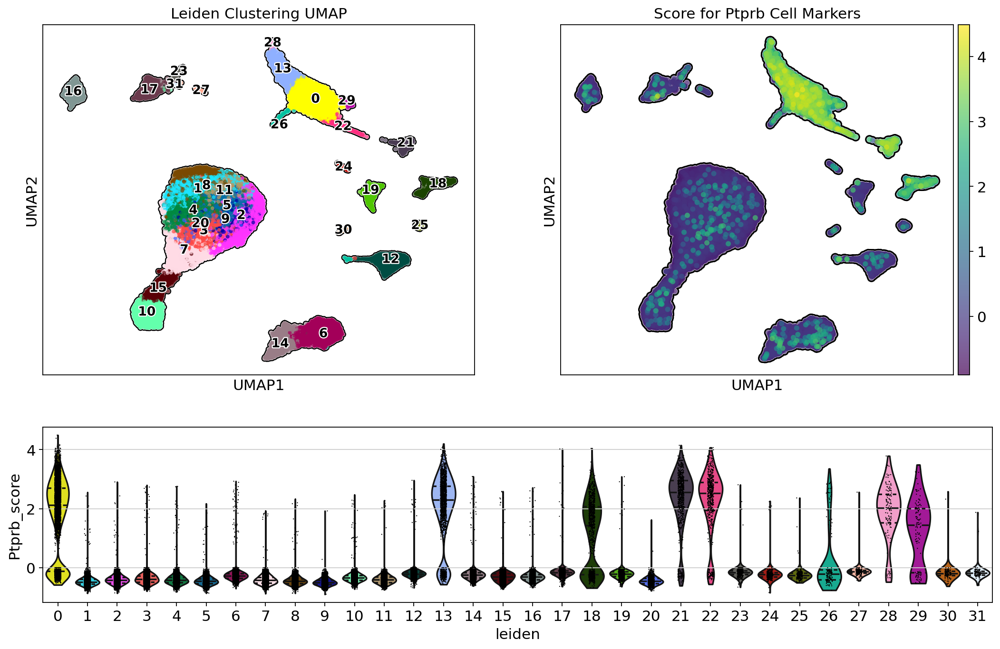

In [10]:
mgl = ['Ptprb']
plot_marker_genes(adata_all, mgl, output_path = "../output/endothelial_subset/taPVAT_Endothelial_Cells_UMAP_violin_plot_for_")

In [11]:
### Subsetting so that adata only includes endothelial cells
adata = adata_all[(adata_all.obs['celltype_broad'].isin(['Endothelial_Cells']))].copy()

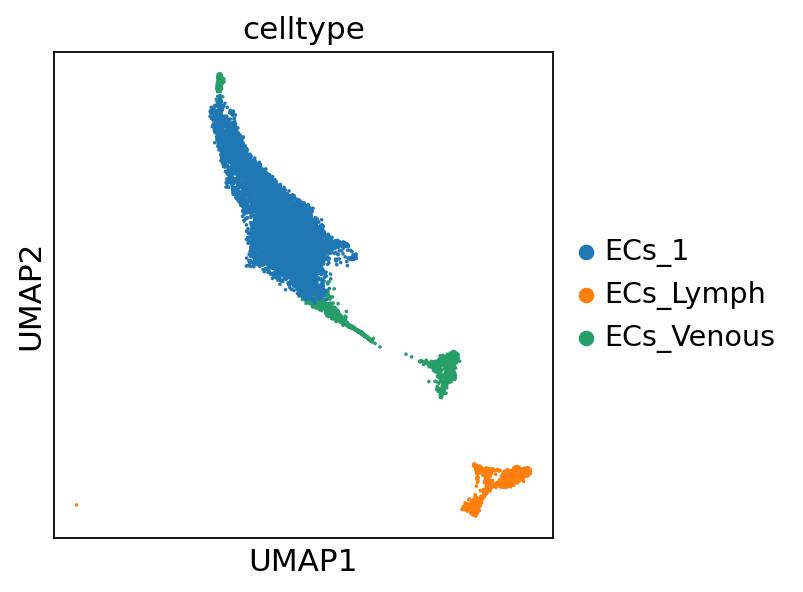

In [12]:
sc.pl.umap(adata, color = 'celltype')

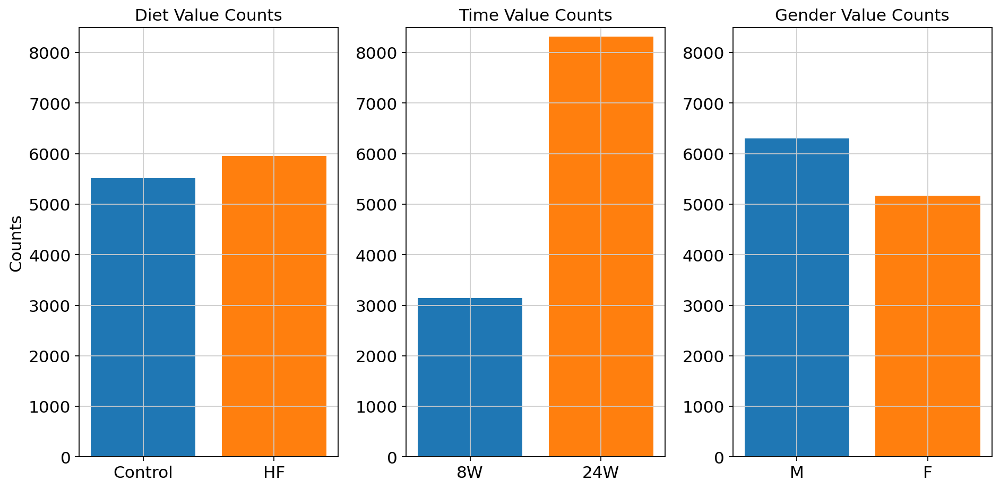

In [13]:
fig = plt.figure(figsize = (12,6))

gs = fig.add_gridspec(ncols=3, nrows=1)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

value_counts = adata.obs.diet.value_counts()
value_counts = value_counts.reindex(['Control', 'HF'])
ax1.bar(value_counts.index, value_counts.values, color = ['C0', 'C1'])
ax1.set_title('Diet Value Counts')
ax1.set_ylabel('Counts')
ax1.set_ylim(0, 8500)

value_counts = adata.obs.time.value_counts()
value_counts = value_counts.reindex(['8W', '24W'])
ax2.bar(value_counts.index, value_counts.values, color = ['C0', 'C1'])
ax2.set_title('Time Value Counts')
ax2.set_ylim(0, 8500)

value_counts = adata.obs.sex.value_counts()
ax3.bar(value_counts.index, value_counts.values, color = ['C0', 'C1'])
ax3.set_title('Gender Value Counts')
ax3.set_ylim(0, 8500)

plt.tight_layout()
plt.show()

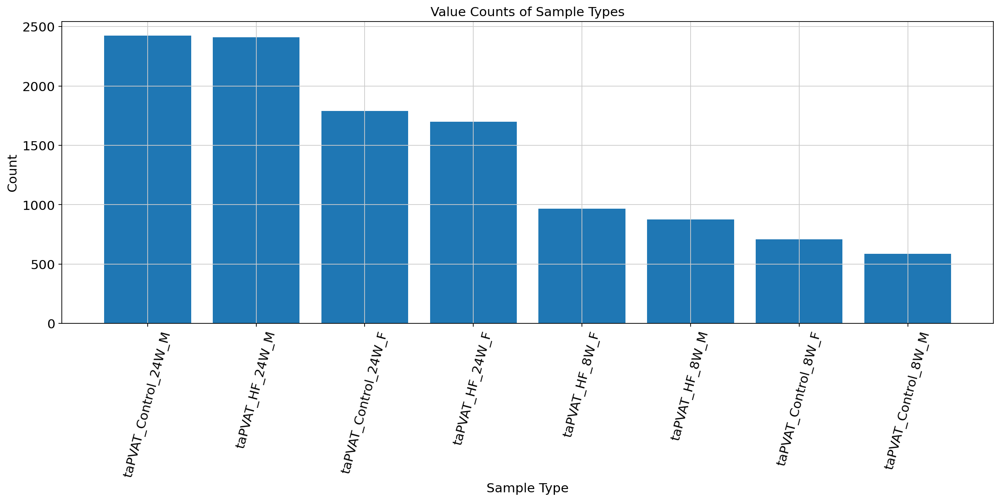

In [14]:
fig, ax = plt.subplots(ncols = 1, figsize = (18,6))

value_counts = adata.obs.sample_type.value_counts()

# Create a bar chart
plt.bar(value_counts.index, value_counts.values)
plt.xticks(rotation=75)

# Add labels and title
plt.xlabel('Sample Type')
plt.ylabel('Count')
plt.title('Value Counts of Sample Types')

# Show the plot
plt.show()

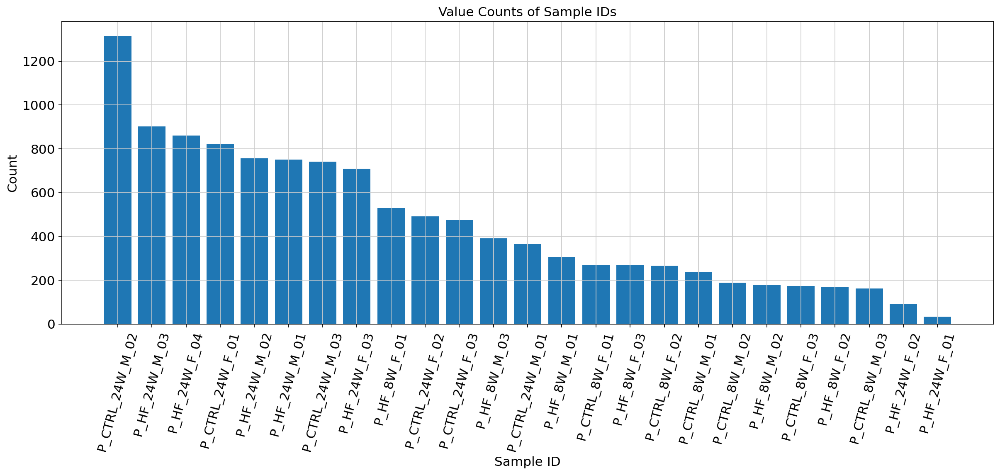

In [15]:
fig, ax = plt.subplots(ncols = 1, figsize = (18,6))

value_counts = adata.obs.sample_id.value_counts()

# Create a bar chart
plt.bar(value_counts.index, value_counts.values)
plt.xticks(rotation=75)

# Add labels and title
plt.xlabel('Sample ID')
plt.ylabel('Count')
plt.title('Value Counts of Sample IDs')

# Show the plot
plt.show()

## Recalculating UMAP with only endothelial cell data

In [16]:
sc.tl.pca(adata)
sc.pp.neighbors(adata, random_state = 0)
sc.tl.umap(adata, min_dist = 0.2)

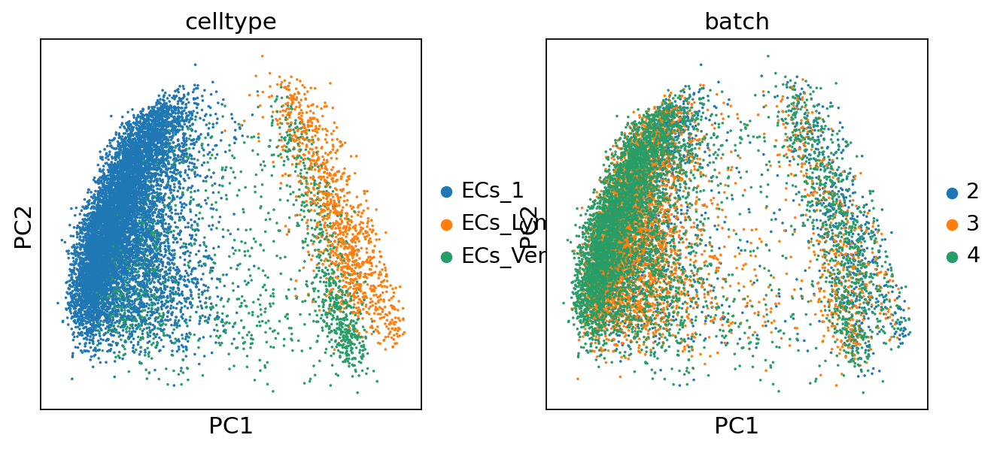

In [17]:
sc.pl.pca(adata, color = ["celltype", "batch"])

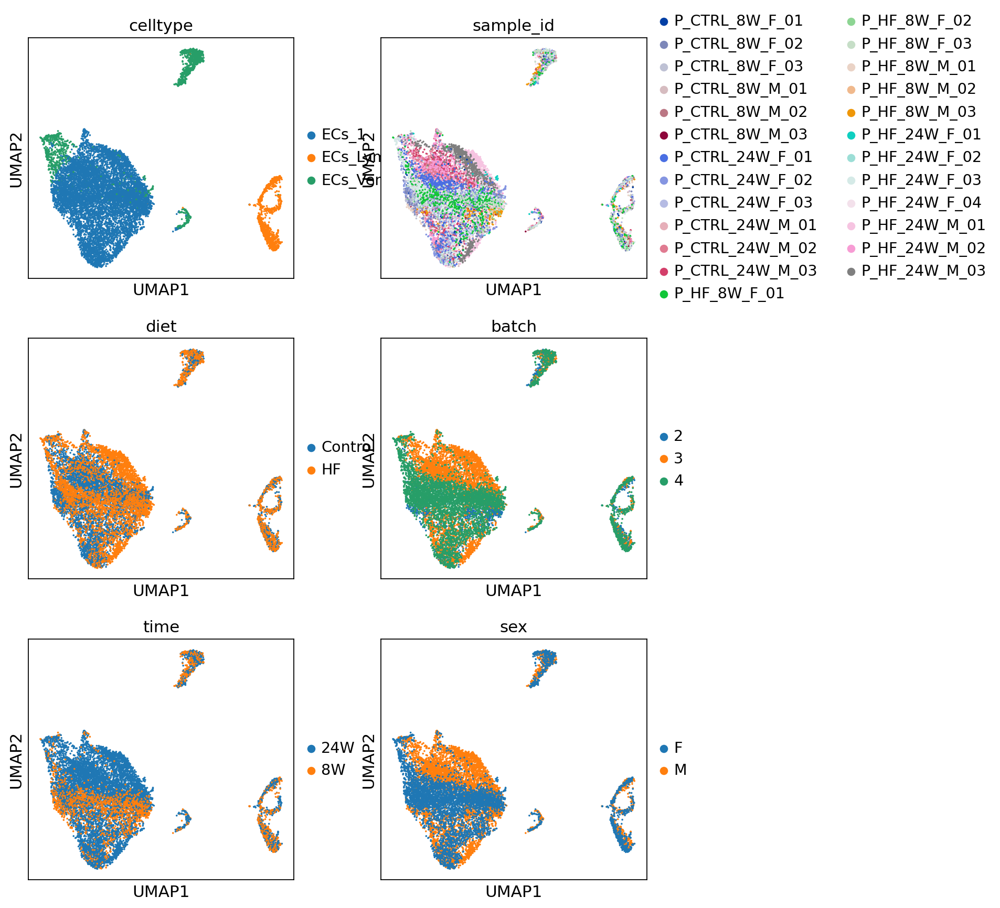

In [18]:
### Samples do not integrate well across batches
sc.pl.umap(adata, color = ['celltype', 'sample_id', 'diet', 'batch', 'time', 'sex',], ncols = 2)

## Batch integration with scVI

In [19]:
scvi.settings.seed = 0

[rank: 0] Global seed set to 0


In [20]:
### Setting up the model
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    categorical_covariate_keys=["Sample"],
    continuous_covariate_keys=["pct_counts_mt", "pct_counts_ribo", "total_counts"]
)

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [21]:
model = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

In [22]:
#model.train()

In [22]:
#####Saving the model
#model.save('./models/taPVAT_endothelial_cells_8W_24W_M_F_HF_CTRL_combined_model_v1')
#####How to reload model:
model = scvi.model.SCVI.load('./models/taPVAT_endothelial_cells_8W_24W_M_F_HF_CTRL_combined_model_v1', adata=adata, use_gpu=True)

INFO     File ./models/taPVAT_endothelial_cells_8W_24W_M_F_HF_CTRL_combined_model_v1/model.pt already downloaded   


In [23]:
latent = model.get_latent_representation()
latent.shape

(11461, 30)

In [24]:
adata.obsm["X_scVI_ec"] = latent
adata.layers["scvi_normalized_ec"] = model.get_normalized_expression(library_size=1e4)

## Rerunning PCA and UMAP on the integrated endothelial cell subset

In [25]:
sc.tl.pca(adata)
sc.pp.neighbors(adata, random_state = 0, use_rep = 'X_scVI_ec')
sc.tl.umap(adata, min_dist = 0.2)
adata.obsm['X_umap_og'] = adata.obsm['X_umap'].copy()

In [26]:
sc.tl.leiden(adata, use_weights= True, resolution = 2, key_added = 'leiden_sub')

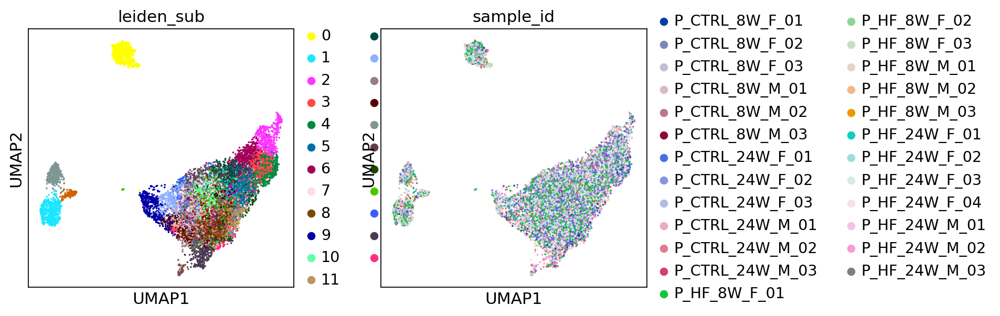

In [27]:
### Samples seem to integrate pretty well
sc.pl.umap(adata, color = ['leiden_sub', 'sample_id'], ncols = 2)

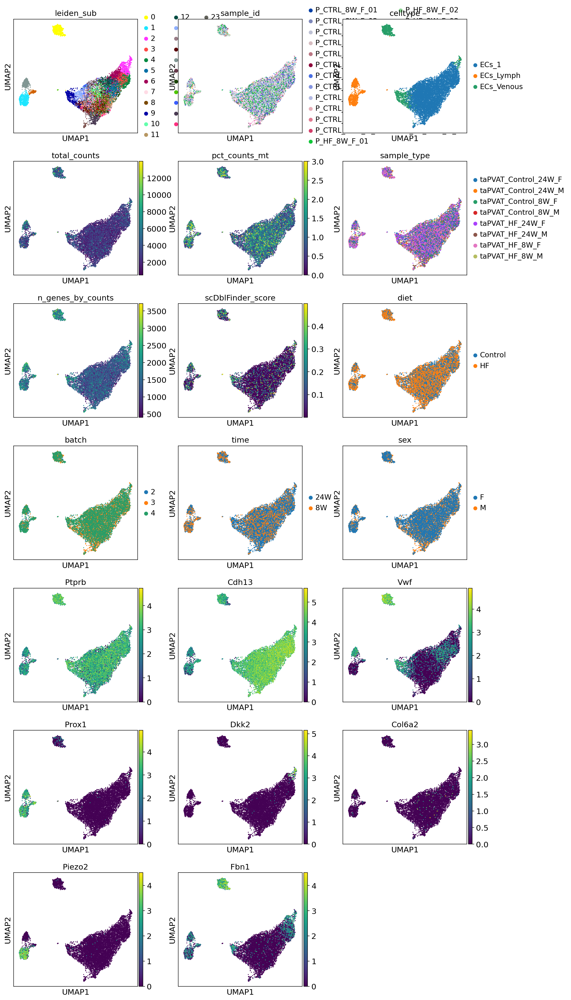

In [28]:
### Samples seem to integrate pretty well now
sc.pl.umap(adata, color = ['leiden_sub', 'sample_id', 'celltype', 'total_counts', 'pct_counts_mt', 'sample_type',
                           'n_genes_by_counts', 'scDblFinder_score', 'diet', 'batch', 'time', 'sex', 
                           'Ptprb','Cdh13', 'Vwf', 'Prox1', 'Dkk2', 'Col6a2', 'Piezo2', 'Fbn1'], ncols = 3)

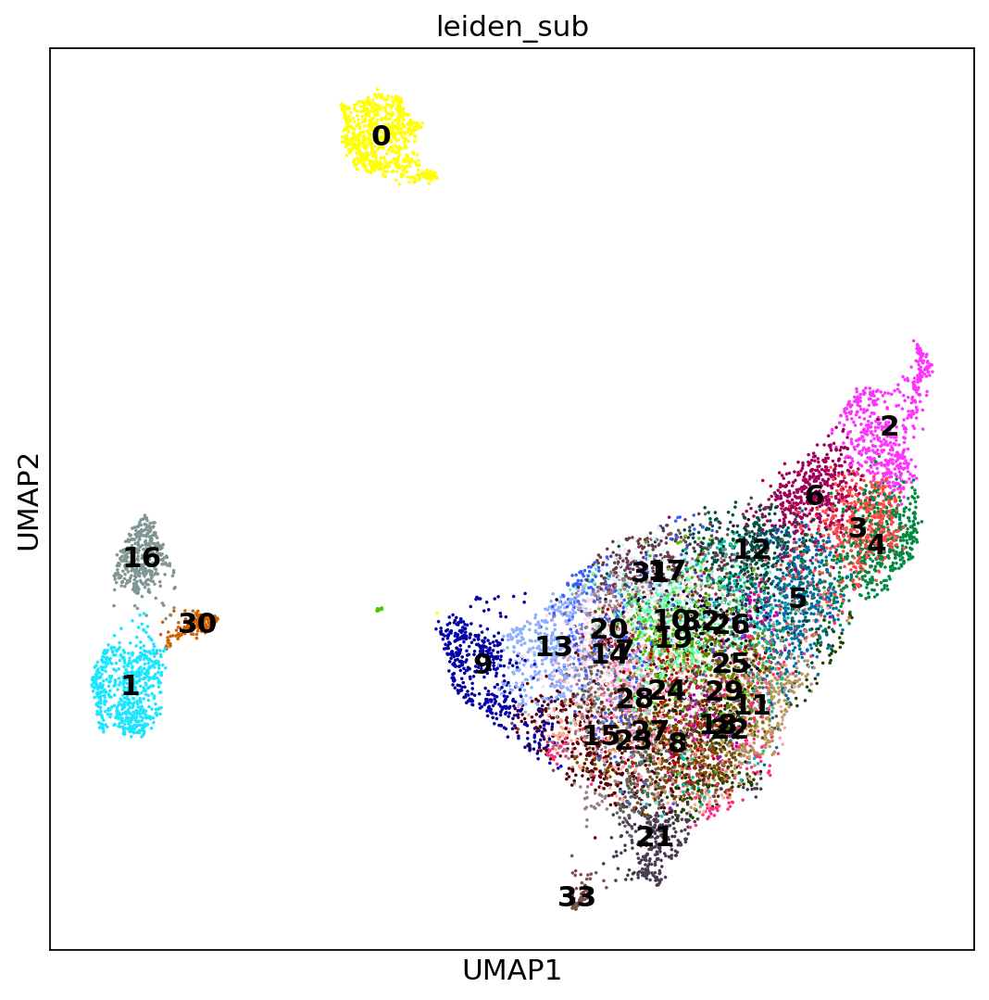

In [29]:
fig, ax = plt.subplots(figsize = (8,8))
sc.pl.umap(adata, color = ['leiden_sub'], ax = ax, legend_loc = 'on data')

<Axes: xlabel='leiden_sub'>

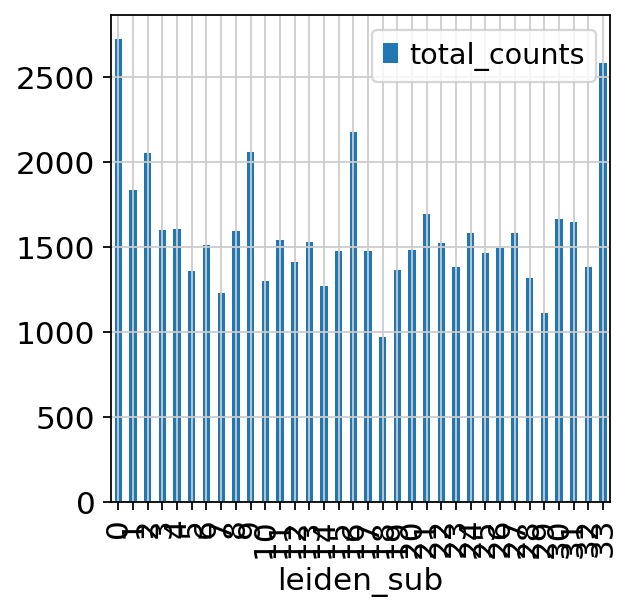

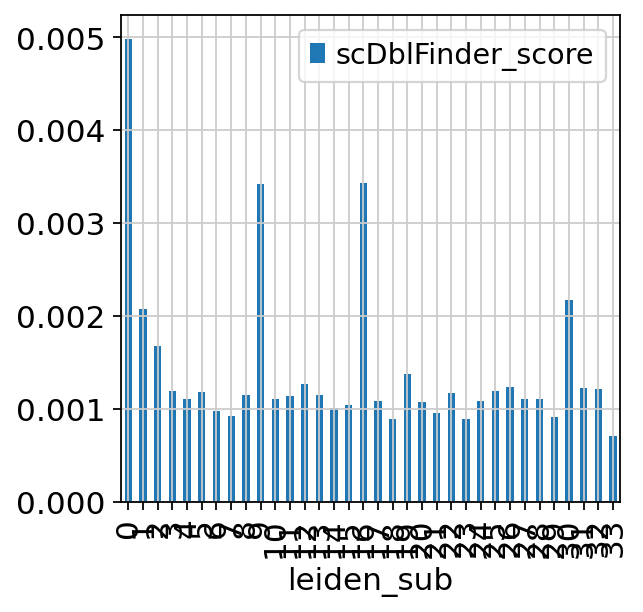

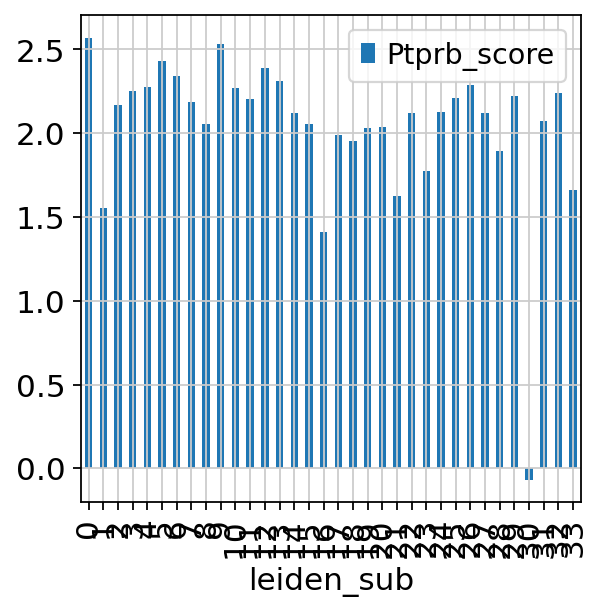

In [30]:
adata.obs.groupby('leiden_sub').median().plot.bar(y = 'total_counts')
adata.obs.groupby('leiden_sub').median().plot.bar(y = 'scDblFinder_score')
adata.obs.groupby('leiden_sub').median().plot.bar(y = 'Ptprb_score')

## Let's try to get the clusters to separate out a bit better

In [31]:
sc.tl.diffmap(adata)
# Calculate neighbors again based on diffusionmap 
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_diffmap')

In [32]:
sc.tl.leiden(adata, resolution=1, key_added = 'leiden_sub_1')

In [33]:
plt.rcParams["figure.figsize"] = [6, 4.5]
sc.tl.paga(adata, groups='leiden_sub_1')

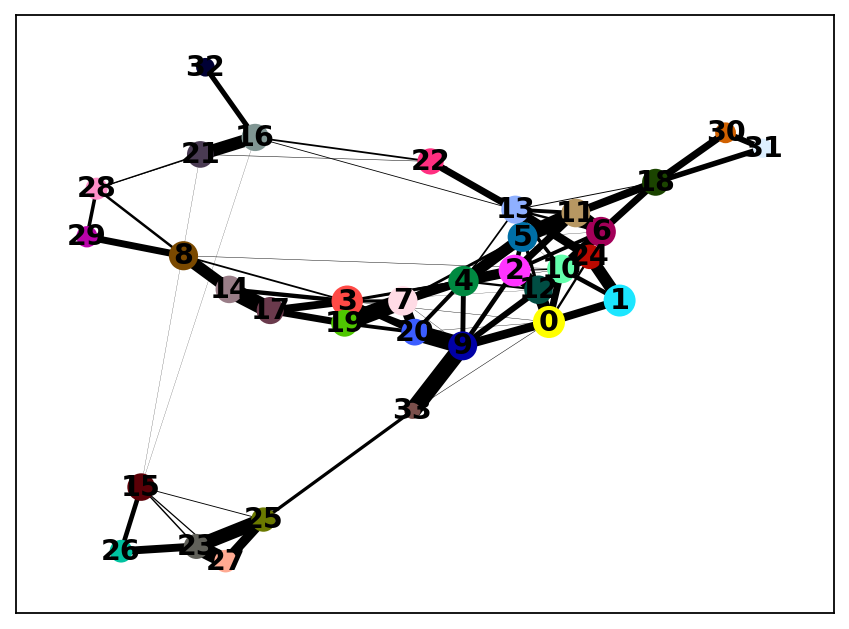

In [34]:
sc.pl.paga(adata)

In [35]:
sc.tl.draw_graph(adata, init_pos='paga', random_state=123)

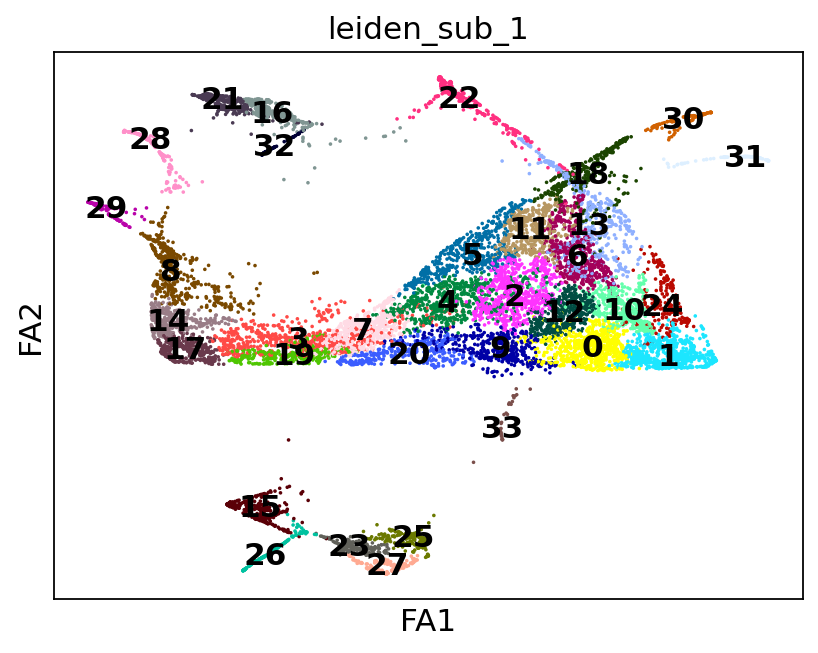

In [36]:
sc.pl.draw_graph(adata, color='leiden_sub_1', legend_loc='on data')

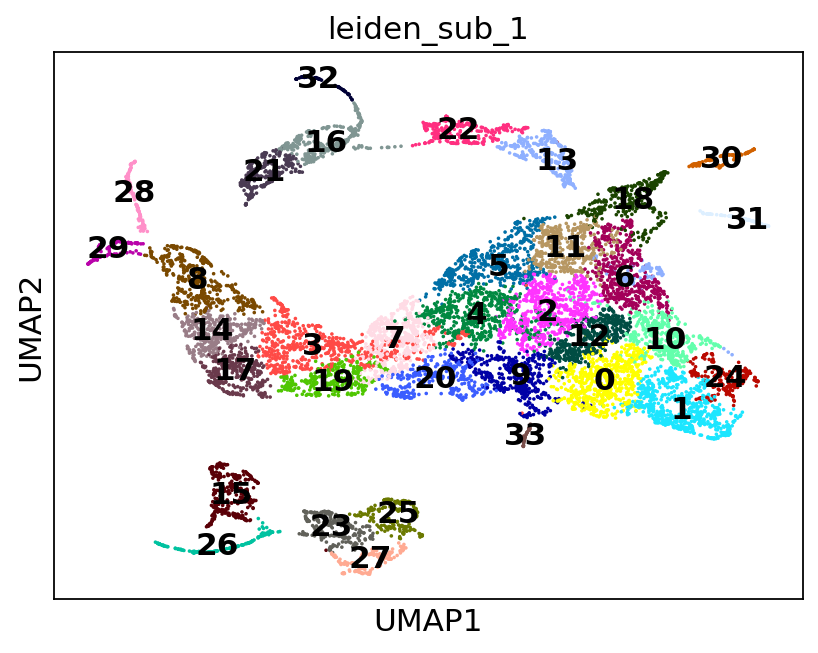

In [37]:
sc.tl.umap(adata, init_pos = 'paga', min_dist = 0.2)
sc.pl.umap(adata, color = 'leiden_sub_1', legend_loc='on data')

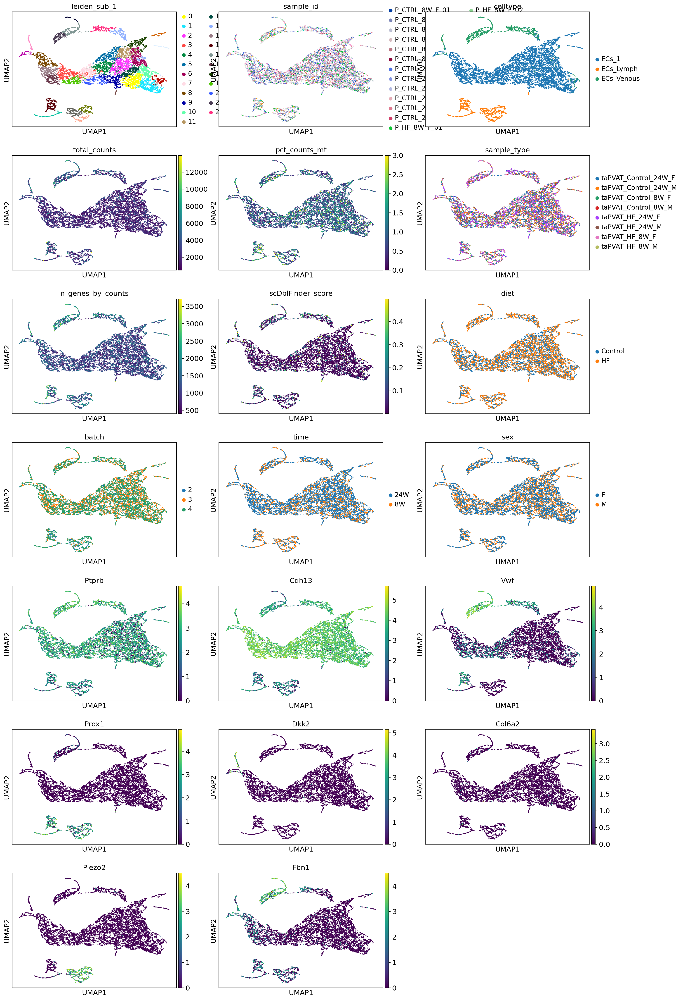

In [38]:
### Samples seem to integrate pretty well now
sc.pl.umap(adata, color = ['leiden_sub_1', 'sample_id', 'celltype', 'total_counts', 'pct_counts_mt', 'sample_type',
                           'n_genes_by_counts', 'scDblFinder_score', 'diet', 'batch', 'time', 'sex', 
                           'Ptprb','Cdh13', 'Vwf', 'Prox1', 'Dkk2', 'Col6a2', 'Piezo2', 'Fbn1'], ncols = 3)

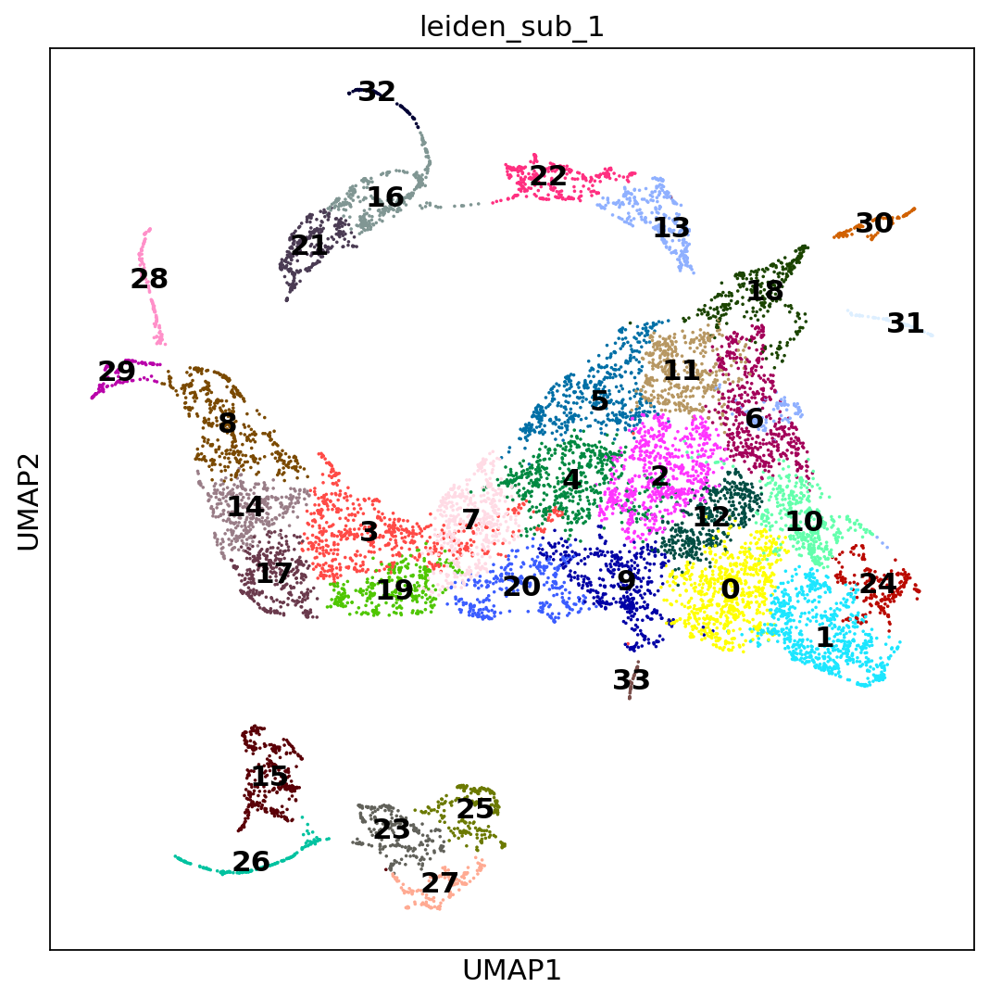

In [39]:
fig, ax = plt.subplots(figsize = (8,8))
sc.pl.umap(adata, color = ['leiden_sub_1'], ax = ax, legend_loc = 'on data')

<Axes: xlabel='leiden_sub_1'>

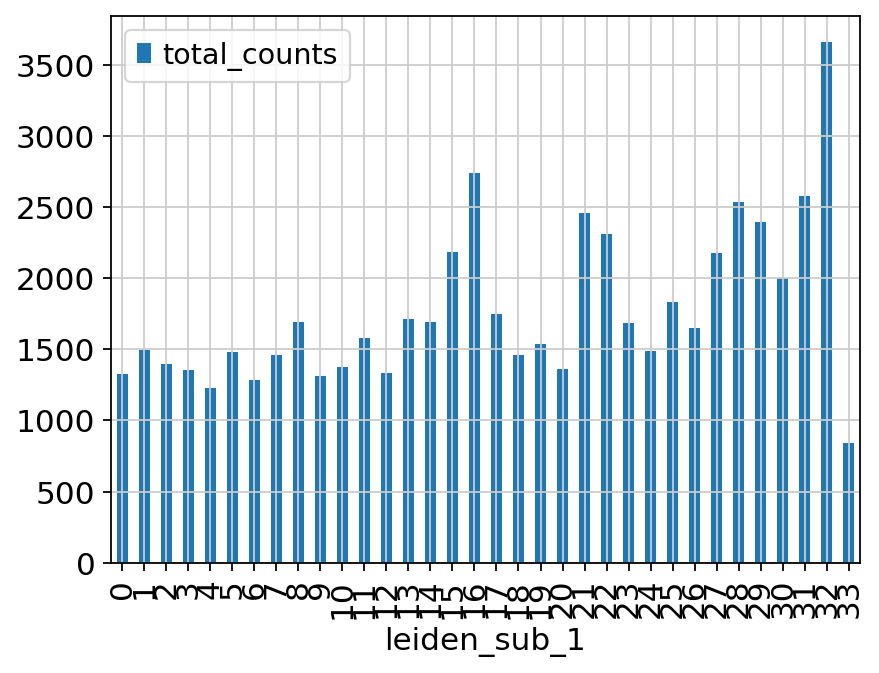

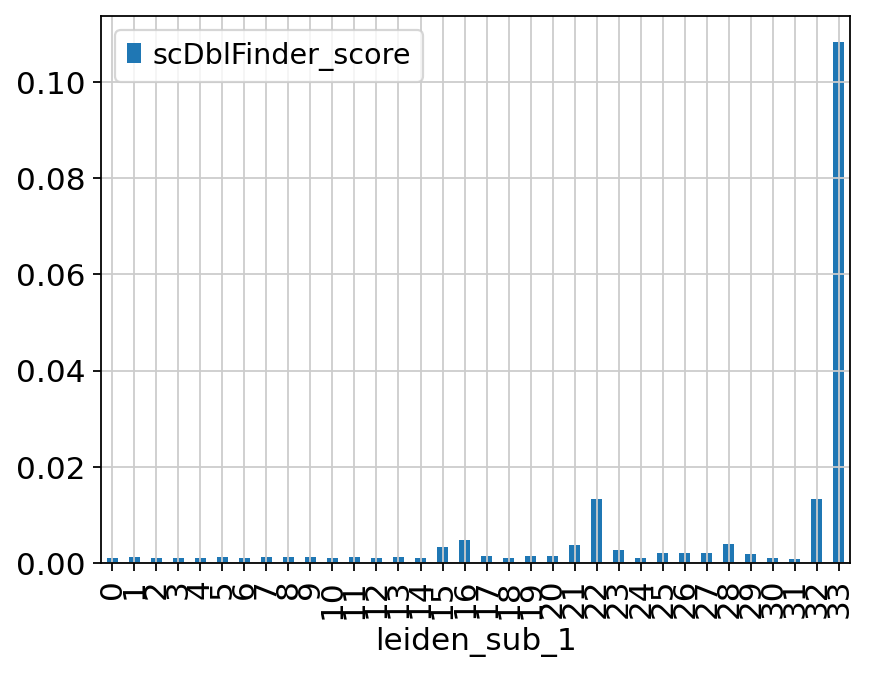

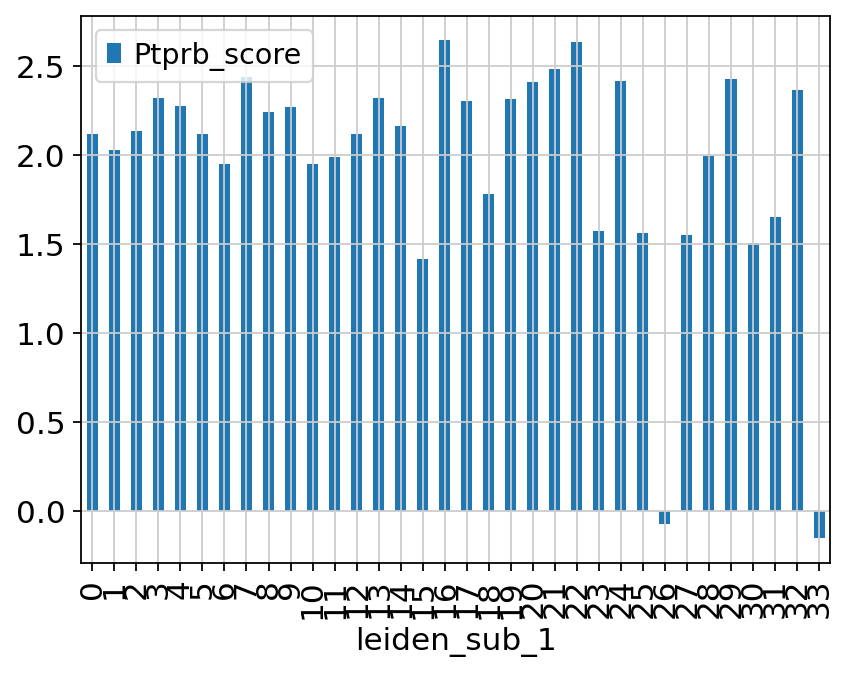

In [40]:
adata.obs.groupby('leiden_sub_1').median().plot.bar(y = 'total_counts')
adata.obs.groupby('leiden_sub_1').median().plot.bar(y = 'scDblFinder_score')
adata.obs.groupby('leiden_sub_1').median().plot.bar(y = 'Ptprb_score')

In [41]:
### Run if you want to replace X_umap with original coordinates
# adata.obsm['X_umap_paga'] = adata.obsm['X_umap'].copy()
# adata.obsm['X_umap'] = adata.obsm['X_umap_og'].copy()

In [42]:
### Run if you want to keep the paga umap
adata.obs.leiden_sub = adata.obs.leiden_sub_1.copy()

## Celltypist Labeling

In [80]:
import celltypist
from celltypist import models

In [81]:
# Enabling `force_update = True` will overwrite existing (old) models.
#models.download_models(force_update = True)

In [82]:
# The `model` argument defaults to `Immune_All_Low.pkl`.
model = models.Model.load(model = 'Healthy_Adult_Heart.pkl')
model.convert()

🧬 Number of genes in the original model: 3874
✅ Conversion done! Number of genes in the converted model: 3156


In [83]:
model.cell_types

array(['AVN_P_cell', 'AVN_bundle_cell', 'Adip1', 'Adip2', 'Adip3',
       'Adip4', 'B', 'B_plasma', 'CD14+Mo', 'CD16+Mo', 'CD4+T_Tfh',
       'CD4+T_Th1', 'CD4+T_Th17', 'CD4+T_Th2', 'CD4+T_act', 'CD4+T_naive',
       'CD4+T_reg', 'CD8+T_cytox', 'CD8+T_em', 'CD8+T_te', 'CD8+T_trans',
       'DC', 'EC10_CMC-like', 'EC1_cap', 'EC2_cap', 'EC3_cap',
       'EC4_immune', 'EC5_art', 'EC6_ven', 'EC7_endocardial', 'EC8_ln',
       'EC9_FB-like', 'FB1', 'FB2', 'FB3', 'FB4_activated', 'FB5', 'FB6',
       'ILC', 'LYVE1+IGF1+MP', 'LYVE1+MP_cycling', 'LYVE1+TIMD4+MP',
       'MAIT-like', 'Mast', 'Meso', 'MoMP', 'NC1_glial', 'NC2_glial_NGF+',
       'NC3_glial', 'NC4_glial', 'NC5_glial', 'NC6_schwann', 'NK_CD16hi',
       'NK_CD56hi', 'Neut', 'PC1_vent', 'PC2_atria', 'PC3_str',
       'PC4_CMC-like', 'Purkinje_cell', 'SAN_P_cell', 'SMC1_basic',
       'SMC2_art', 'T/NK_cycling', 'aCM1', 'aCM2', 'aCM3', 'aCM4', 'aCM5',
       'gdT', 'vCM1', 'vCM2', 'vCM3_stressed', 'vCM4', 'vCM5'],
      dtype=object

In [84]:
# Alternatively, just specify the model name (recommended as this ensures the model is intact every time it is loaded).
predictions = celltypist.annotate(adata, model = model, majority_voting = True)

🔬 Input data has 11461 cells and 20743 genes
🔗 Matching reference genes in the model
🧬 2974 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [85]:
# Get an `AnnData` with predicted labels embedded into the cell metadata columns.
adata_cell = predictions.to_adata()

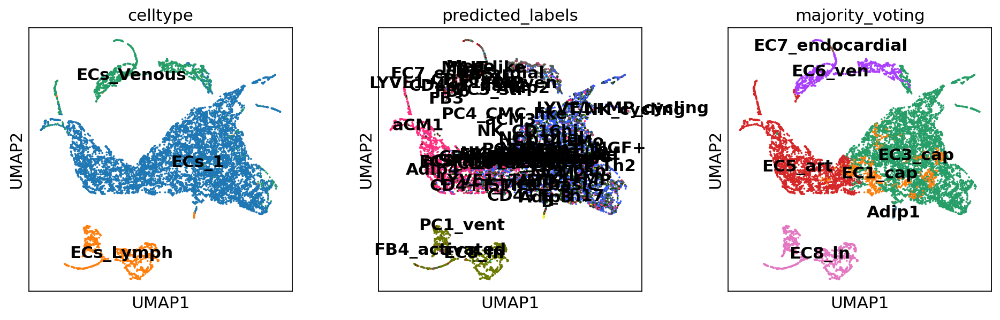

In [86]:
sc.pl.umap(adata_cell, color = ['celltype', 'predicted_labels', 'majority_voting'], legend_loc = 'on data')

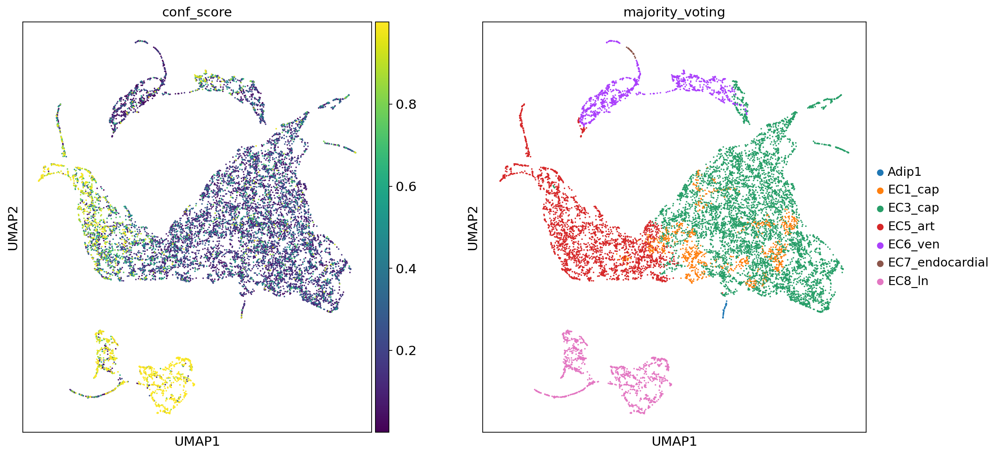

In [87]:
fig = plt.figure(figsize = (16,8))

gs = fig.add_gridspec(ncols=2, nrows=1)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

sc.pl.umap(adata_cell, color = ['conf_score'], ax = ax1, show = False)
sc.pl.umap(adata_cell, color = ['majority_voting'], ax = ax2, show = False)
plt.show()

In [88]:
adata.obs.majority_voting.value_counts()

EC3_cap            5783
EC5_art            2574
EC8_ln             1084
EC6_ven            1037
EC1_cap             924
Adip1                32
EC7_endocardial      27
Name: majority_voting, dtype: int64

## Running rank_genes_groups to find DEGs by leiden_sub clusters

In [56]:
## Need to run this to get rank_genes_groups to work
adata.uns['log1p']["base"] = None

In [57]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden_sub', method='wilcoxon', use_raw = True, tie_correct = True, pts = True)

In [58]:
sc.tl.dendrogram(adata, groupby = 'leiden_sub')

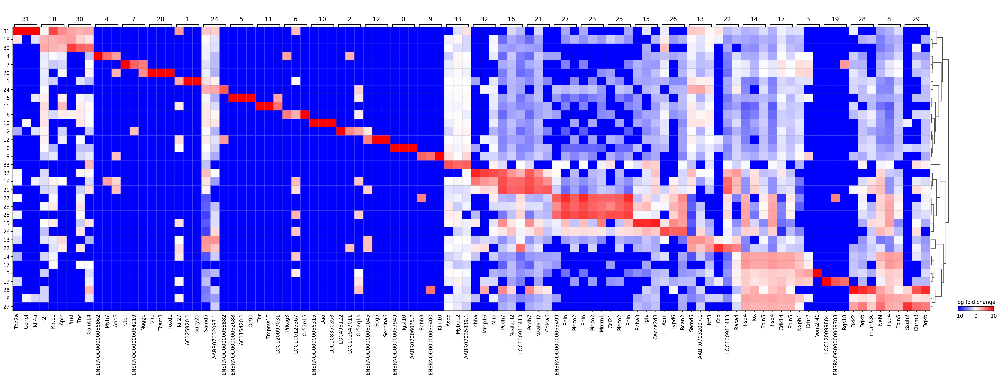

In [59]:
sc.pl.rank_genes_groups_matrixplot(
    adata,
    n_genes=3,
    values_to_plot="logfoldchanges",
    cmap='bwr',
    vmin=-10,
    vmax=10,
    min_logfoldchange=3,
    colorbar_title='log fold change'
)

In [60]:
#sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
#pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(100).to_csv('../output/taPVAT_ECs_8W_24W_HF_CTRL_M_F_rank_genes_groups_top_100_leiden_sub.csv')

## Manually annotating cell types with marker genes

In [64]:
df = pd.read_csv('../output/taPVAT_ECs_8W_24W_HF_CTRL_M_F_rank_genes_groups_top_100_leiden_sub.csv')
df.drop(df.columns[0], axis=1, inplace = True)
df.head(10)

,0,1,2,3,4,5,6,7,8,9,...,24,25,26,27,28,29,30,31,32,33
0,Nrp1,Nrp1,Myo10,Nxph1,Myo10,Kdr,Nav3,Ank3,Nebl,Ablim3,...,Samd5,Ccl21,Adm,ENSRNOG00000063499,Dkk2,Ssuh2,Prnd,Top2a,Inhba,Aspg
1,Eya2,Akr1c15,Itpkb,Azin1,Mgll,Eepd1,Nrp2,Ptprg,Thsd4,AABR07007032.1,...,Hdac9,Piezo2,Lypd6,Reln,Dgkb,Chrm3,Tnc,Cenpf,Mmp16,Mybpc2
2,Ncald,Ccdc85a,Ablim3,Arl15,Ank3,Ank3,Tcf4,St6galnac3,Fbln5,Myo10,...,AABR07032097.1,Reln,Rcan2,Piezo2,Tmem63c,Dgkb,Galnt14,Kif4a,Mlip,AABR07035839.1
3,Ccdc85a,RGD1565355,Nrp1,Kcnt2,Flt1,Plxna2,Etl4,Flnb,Pdgfd,Nrp1,...,Pde1c,Mmrn1,Ccdc141,Scn3a,Chrm3,Prune2,Ust,Ect2,Card11,Ucp3
4,LOC100362814,Eya2,Mgll,Cdk14,Eng,Myo10,Hspg2,Tbc1d9,Ifitm10,Fhod3,...,Fhod3,Maf,Hgf,Ccl21,Kcnab1,Prdm16,Ano4,Cdca2,Ntm,ENSRNOG00000064491
5,RGD1565355,Fhod3,Hspg2,Thsd4,Kdr,Mgll,Col15a1,Mgll,Prdm16,Mcf2l,...,Aqp1,Fam205a,Kif21a,Pard6g,Ptprj,Tgfb2,Nid2,Bub1b,Olr1,Fzd9
6,Ablim3,LOC100362814,Eepd1,Mecom,Btnl9,Lrrc8c,Hdac9,Myo10,LOC679924,Ank3,...,Palldl1,ENSRNOG00000063499,LOC690319,Mmrn1,Snx10,Nebl,Nrp2,Kif20b,Cobl,ENSRNOG00000067771
7,Car4,LOC108352070,Etl4,Slc26a10,Plxna2,Vcl,Nrp1,Flt1,Tox,RGD1565355,...,Akr1c15,Sema3a,Nsg1,Mcub,Vcan,Kank4,Rasa3,Ankle1,Pthlh,LOC100912683
8,Myo10,Dach1,Flt1,Pdgfd,Dlc1,Rapgef1,Adamts9,Lmo7,Cdk14,Btnl9,...,Dnm3,Tc2n,Tfap2e,Mctp1,Atp2b2,Pdgfd,Rassf2,Nusap1,Fstl4,Otol1
9,LOC108352070,AABR07007032.1,Tcf4,Smad6,Itpkb,Igfbp7,Rcsd1,AABR07028615.1,Adam22,Itpkb,...,ENSRNOG00000065882,Dtx1,Thsd7b,Tc2n,Tenm1,Bmx,Relt,Espl1,Spsb4,ENSRNOG00000068896


In [69]:
### Gather a list of the top three DEGs in each cluster
first_element = []
for col_name, col_data in df.iteritems():
    first_element.extend(col_data.iloc[0:1].tolist())

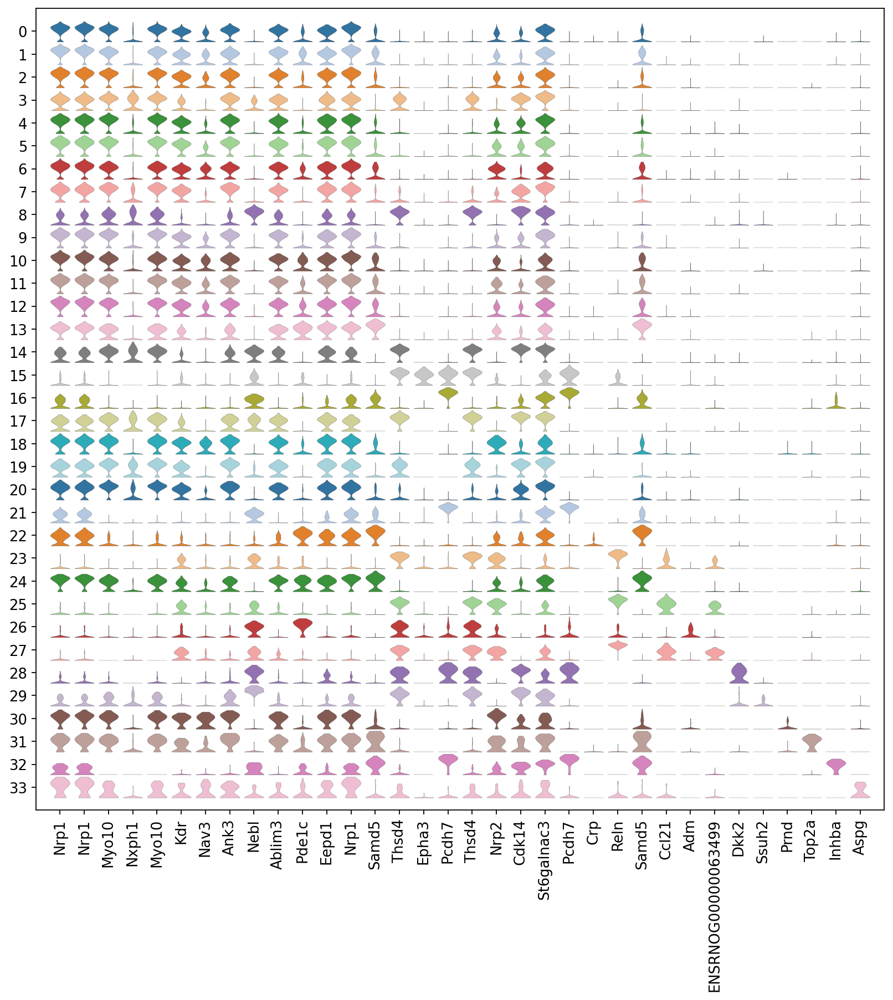

In [70]:
mgl = first_element

ax = sc.pl.stacked_violin(adata, 
                          mgl, 
                          use_raw = True,
                          groupby='leiden_sub', 
                          swap_axes = False,
                          row_palette = 'tab20')

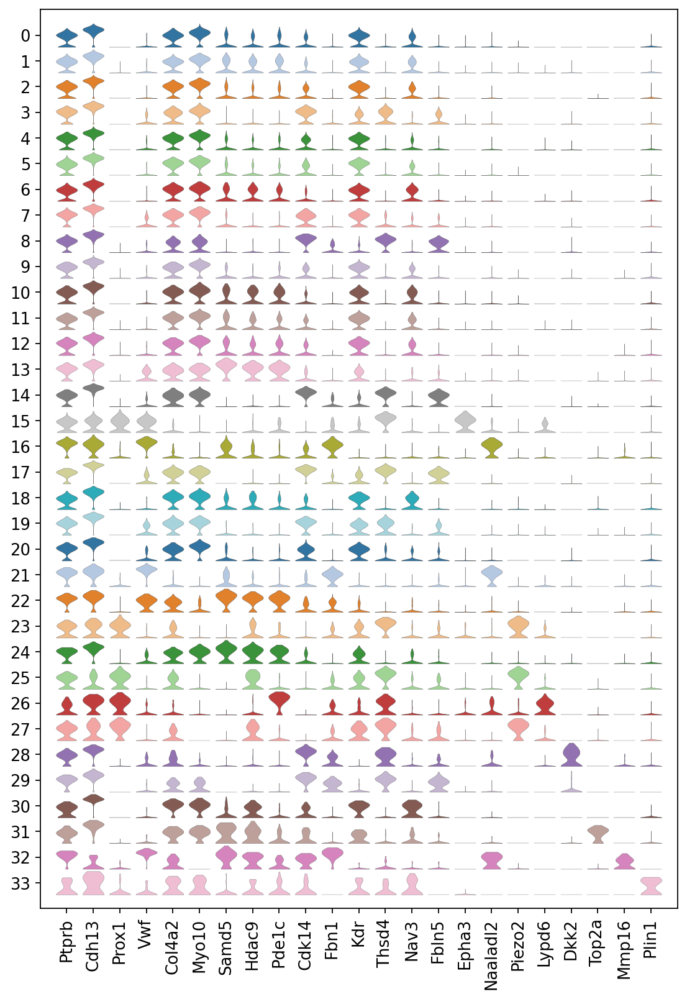

In [72]:
### https://www.nature.com/articles/s41569-022-00770-1/tables/2
### https://www.sciencedirect.com/science/article/pii/S0092867420300623#bib76

mgl = ['Ptprb', 'Cdh13',   #General EC marker genes 
       'Prox1',            #LEC marker
       'Vwf',              #Venous marker
       'Col4a2',
       'Myo10',
       'Samd5',
       'Hdac9',
       'Pde1c',
       'Cdk14',
       'Fbn1',
       'Kdr',
       'Thsd4',
       'Nav3',
       'Fbln5',
       'Epha3',
       'Naaladl2',
       'Piezo2',
       'Lypd6',
       'Dkk2',
       'Top2a',
       'Mmp16',
       'Plin1'
      ]

### couldn't find: ['Ccl21a', 'Cfn','Cxcl5','Ifi203', 'Ifit3b', 'Igs15',]
ax = sc.pl.stacked_violin(adata, 
                          mgl, 
                          use_raw = True,
                          groupby='leiden_sub', 
                          swap_axes = False,
                          row_palette = 'tab20')

In [112]:
def cell_type_mapping(x):
    cell_type_dict = {
        '0': "ECs_Cap",
        '1': "ECs_Cap",
        '2': 'ECs_Cap',
        '3': 'ECs_Artery',
        '4': 'ECs_Cap' ,
        '5': 'ECs_Cap', 
        '6': 'ECs_Cap',  
        '7': 'ECs_Cap',
        '8': 'ECs_Artery', 
        '9': 'ECs_Cap',
        '10': 'ECs_Cap',  
        '11': 'ECs_Cap', 
        '12': 'ECs_Cap',  
        '13': 'ECs_Venous',
        '14': 'ECs_Artery', 
        '15': 'ECs_Lymph', 
        '16': 'ECs_Venous_Fbn1+',
        '17': 'ECs_Artery',
        '18': 'ECs_Cap',  
        '19': 'ECs_Artery',
        '20': 'ECs_Cap',
        '21': 'ECs_Venous_Fbn1+',
        '22': 'ECs_Venous',
        '23': 'ECs_Lymph_Piezo2+',
        '24': 'ECs_Cap',
        '25': 'ECs_Lymph_Piezo2+',
        '26': 'ECs_Lymph',
        '27': 'ECs_Lymph_Piezo2+',
        '28': 'ECs_Artery',
        '29': 'ECs_Artery',
        '30': 'ECs_Cap',
        '31': 'ECs_Cap',
        '32': 'ECs_Venous_Fbn1+',
        '33': 'Doublets'
    }

    return cell_type_dict.get(str(x), 'Unknown_Cell_Type')

adata.obs['celltype_sub'] = adata.obs.leiden_sub.map(cell_type_mapping)
print(adata.obs['celltype_sub'].value_counts())

ECs_Cap              6674
ECs_Artery           2304
ECs_Venous_Fbn1+      704
ECs_Venous            663
ECs_Lymph_Piezo2+     583
ECs_Lymph             501
Doublets               32
Name: celltype_sub, dtype: int64


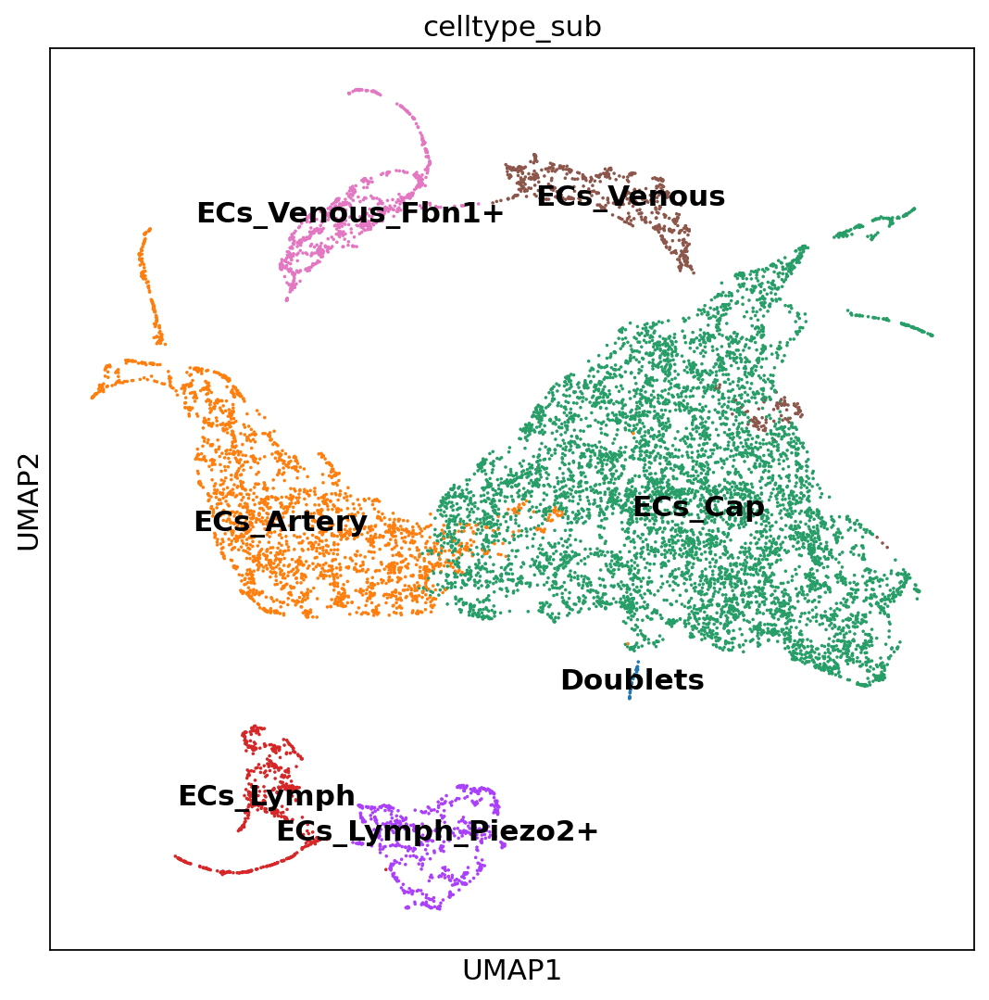

In [113]:
fig, ax = plt.subplots(figsize = (8,8))
sc.pl.umap(adata, color = ['celltype_sub'], ax = ax, legend_loc = 'on data')

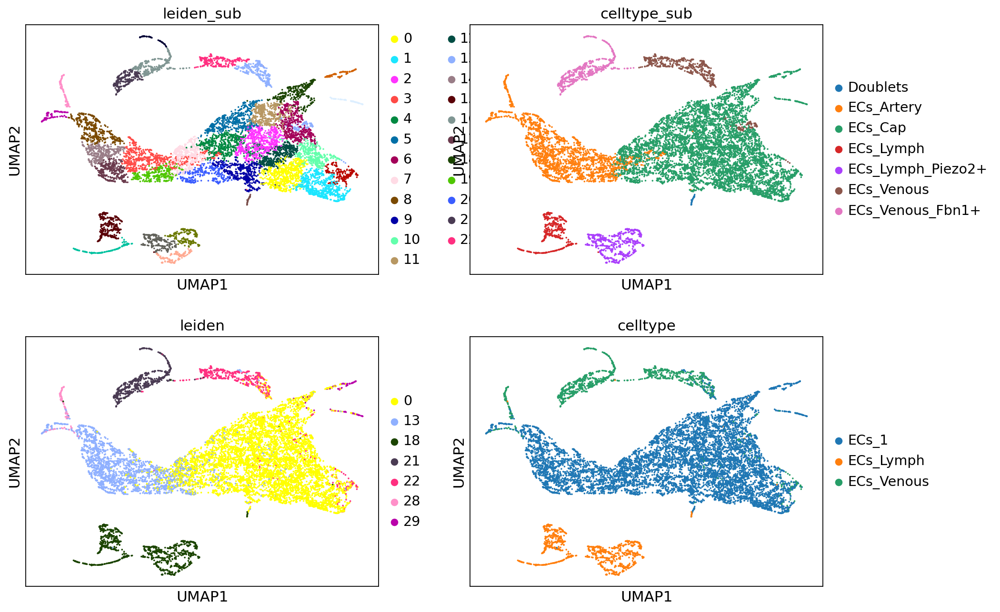

In [114]:
sc.pl.umap(adata, color = ['leiden_sub', 'celltype_sub', 'leiden', 'celltype'], ncols = 2)

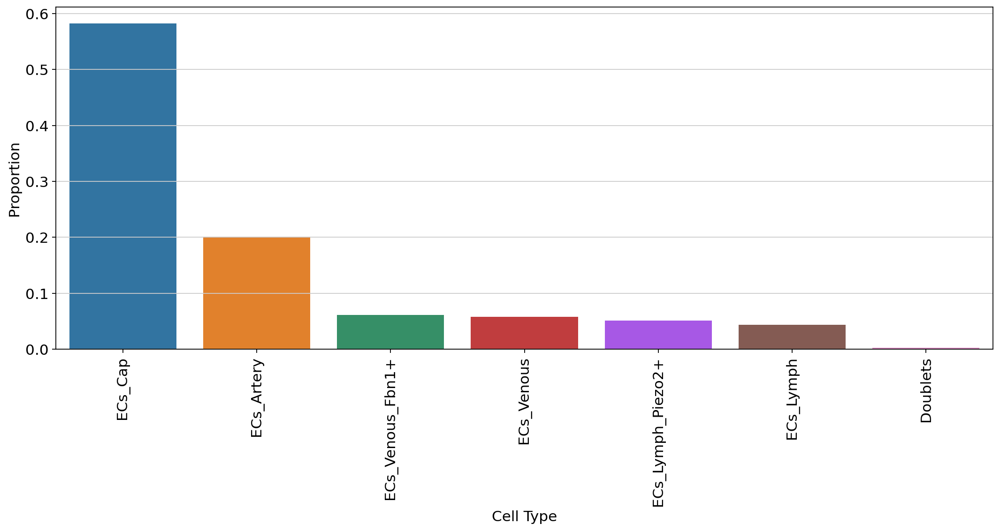

In [115]:
N = len(adata)
fig, ax = plt.subplots(figsize = (16,6))

props_dict = {"Cell Type":[], "Proportion":[]}
for i in np.unique(adata.obs.celltype_sub):
    i_len = len(adata[adata.obs.celltype_sub == i])
    props_dict["Cell Type"].append(i)
    props_dict["Proportion"].append(i_len/N)
props_df = pd.DataFrame(props_dict)

sns.barplot(x = "Cell Type", y = "Proportion", ax = ax, data = props_df, log = False, 
            order = props_df.sort_values("Proportion", ascending = False)["Cell Type"])
plt.xticks(rotation = 90)

#plt.savefig('../output/taPVAT_ECs_proportions_labeled.png', bbox_inches = "tight")
plt.show()

## Running rank_genes_groups to find DEGs by cell type

In [116]:
## Need to run this to get rank_genes_groups to work
adata.uns['log1p']["base"] = None

In [117]:
sc.tl.rank_genes_groups(adata, groupby = 'celltype_sub', method='wilcoxon', use_raw = True, tie_correct = True, pts = True)
sc.tl.dendrogram(adata, groupby = 'celltype_sub')

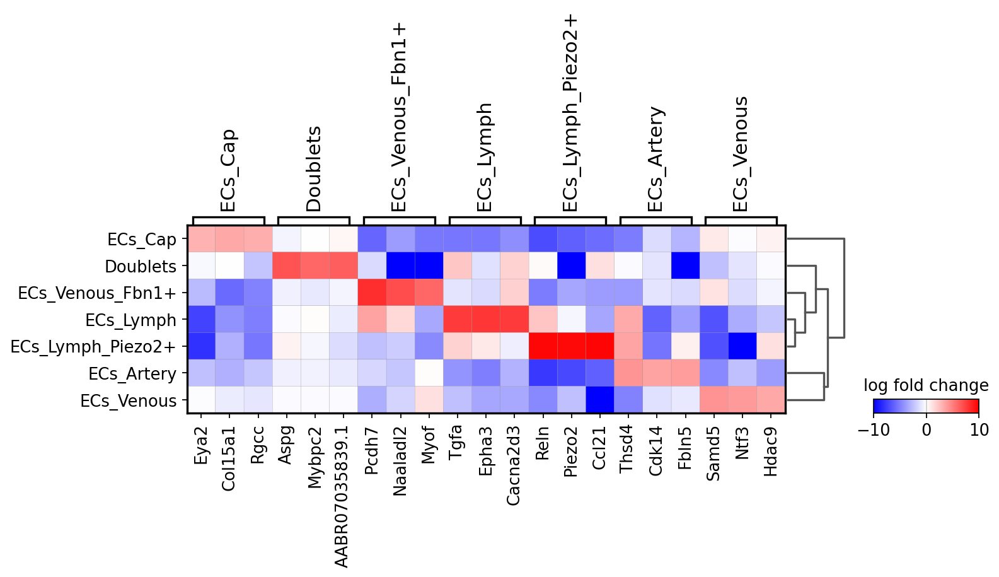

In [118]:
sc.pl.rank_genes_groups_matrixplot(
    adata,
    n_genes=3,
    values_to_plot="logfoldchanges",
    cmap='bwr',
    vmin=-10,
    vmax=10,
    min_logfoldchange=3,
    colorbar_title='log fold change'
)

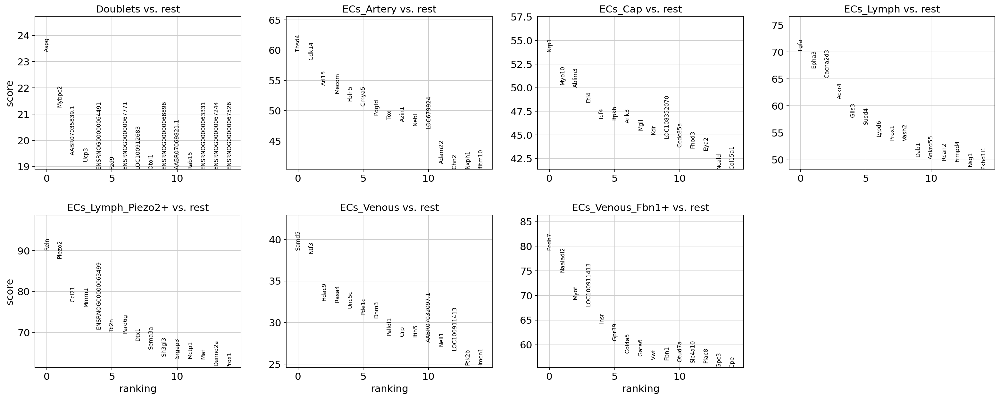

In [119]:
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(100).to_csv('../output/PVAT_ECs_8W_24W_HF_CTRL_M_F_rank_genes_groups_top_100_celltype_sub.csv')

## Visualizing the location of expression of common marker genes

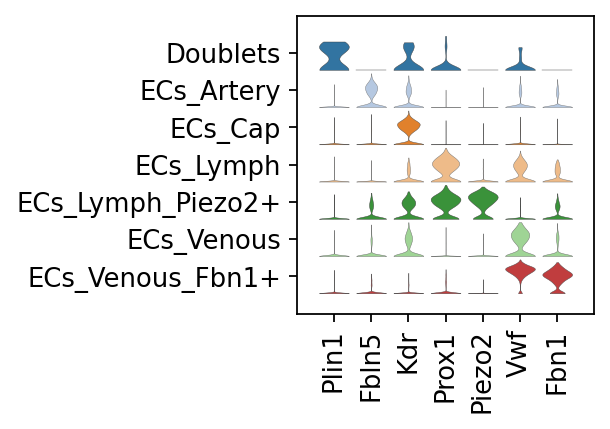

In [120]:
### Violin plot of gene expression for labeling "high-level" cell-types
mgl = ['Plin1',  #Doublets
       'Fbln5',  #ECs_Artery
       'Kdr',    #ECs_Capillary
       'Prox1',  #ECs_Lymph
       'Piezo2', #ECs_Lymph_Piezo2+
       'Vwf',    #ECs_Venous
       'Fbn1'    #ECs_Venous_Fbn1+
      ]

ax = sc.pl.stacked_violin(adata, 
                          mgl, 
                          use_raw = True,
                          groupby='celltype_sub', 
                          swap_axes = False,
                          row_palette = 'tab20')

## Comparing our labels to labels used in other literature

In [121]:
def filter_genes_in_dict(adata, cell_type_genes_dict):
    """
    Filter genes in the cell_type_genes_dict that are not present in the adata object for each cell type.

    Parameters:
    adata (anndata.AnnData): The AnnData object containing gene expression data.
    cell_type_genes_dict (dict): A dictionary where keys are cell types and values are lists of genes.

    Returns:
    filtered_dict (dict): A filtered version of cell_type_genes_dict with only genes present in the adata.
    """
    filtered_dict = {}

    for cell_type, genes in cell_type_genes_dict.items():
        # Filter genes that are present in adata
        valid_genes = [gene for gene in genes if gene in adata.var_names]

        # Add the filtered genes to the dictionary
        filtered_dict[cell_type] = valid_genes

    return filtered_dict

In [122]:
# Load the tab-delimited file into a DataFrame
markers_mouse = pd.read_csv('../data/41586_2022_4518_MOESM5_ESM_ALL.txt', sep = '\t', index_col = 0)

# Initialize an empty dictionary
cluster_dict = {}

# Iterate through unique clusters and create a dictionary entry for each
for cluster in markers_mouse['cluster'].unique():
    # Filter the DataFrame for rows with the current cluster
    cluster_df = markers_mouse[markers_mouse['cluster'] == cluster]
    
    # Sort the cluster DataFrame by the "fold-change" column in descending order
    sorted_cluster_df = cluster_df.sort_values(by='avg_log2FC', ascending=False)
    
    # Extract the top 100 gene values for the cluster as a list
    top_genes = sorted_cluster_df['gene'].head(50).tolist()
    
    # Add the top 100 gene values list to the dictionary with the cluster as the key
    cluster_dict[cluster] = top_genes

filtered_markers = filter_genes_in_dict(adata, cluster_dict)

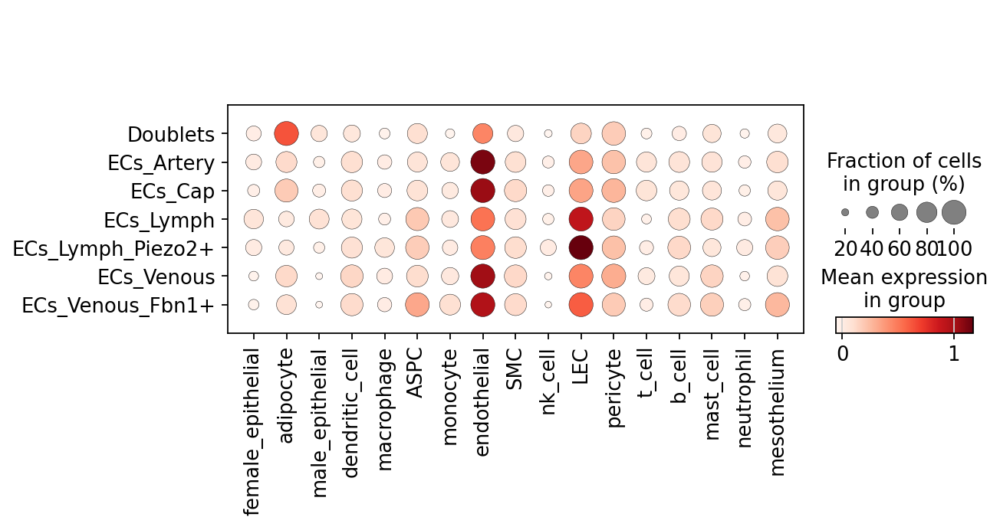

In [123]:
keys = filtered_markers.keys()

for key in keys:
    value = filtered_markers[key]
    sc.tl.score_genes(adata, value, ctrl_size=len(value), gene_pool=None, n_bins=50, score_name=key, use_raw=True)

sc.pl.dotplot(adata, list(keys), groupby='celltype_sub', dendrogram=False, save='_EmontMouseMarkers50_celltype_ECs')

In [124]:
# Load the tab-delimited file into a DataFrame
markers_human = pd.read_csv('../data/41586_2022_4518_MOESM4_ESM_ALL.txt', sep = '\t', index_col = 0)

# Initialize an empty dictionary
cluster_dict = {}

# Iterate through unique clusters and create a dictionary entry for each
for cluster in markers_human['cluster'].unique():
    # Filter the DataFrame for rows with the current cluster
    cluster_df = markers_human[markers_human['cluster'] == cluster]
    
    # Sort the cluster DataFrame by the "fold-change" column in descending order
    sorted_cluster_df = cluster_df.sort_values(by='avg_log2FC', ascending=False)
    
    # Extract the top 100 gene values for the cluster as a list
    top_genes = sorted_cluster_df['gene'].head(50).tolist()
    
    # Add the top 100 gene values list to the dictionary with the cluster as the key
    cluster_dict[cluster] = [word.capitalize() for word in top_genes]

filtered_markers = filter_genes_in_dict(adata, cluster_dict)

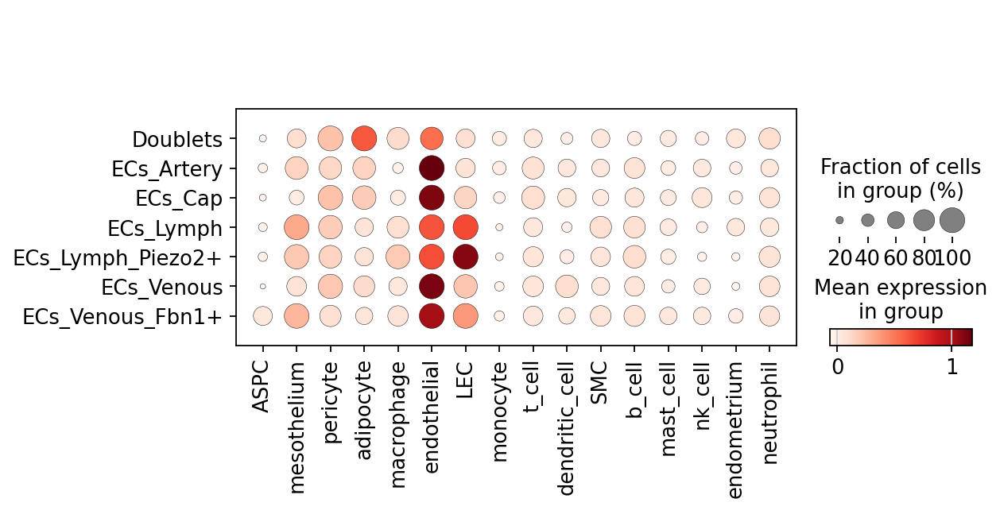

In [125]:
keys = filtered_markers.keys()

for key in keys:
    value = filtered_markers[key]
    sc.tl.score_genes(adata, value, ctrl_size=len(value), gene_pool=None, n_bins=50, score_name=key, use_raw=True)

sc.pl.dotplot(adata, list(keys), groupby='celltype_sub', dendrogram=False, save='_EmontHumanMarkers50_celltype_ECs')

In [126]:
# Load the tab-delimited file into a DataFrame
markers_human_BAT = pd.read_csv('../data/Sun_markers_humanBAT.txt', sep = '\t', index_col = 0)

# Initialize an empty dictionary
cluster_dict = {}

# Iterate through unique clusters and create a dictionary entry for each
for cluster in markers_human_BAT['cluster'].unique():
    # Filter the DataFrame for rows with the current cluster
    cluster_df = markers_human_BAT[markers_human_BAT['cluster'] == cluster]
    
    # Sort the cluster DataFrame by the "fold-change" column in descending order
    sorted_cluster_df = cluster_df.sort_values(by='avg_logFC', ascending=False)
    
    # Extract the top 100 gene values for the cluster as a list
    top_genes = sorted_cluster_df['gene'].head(50).tolist()
    
    # Add the top 100 gene values list to the dictionary with the cluster as the key
    cluster_dict[cluster] = [word.capitalize() for word in top_genes]

filtered_markers = filter_genes_in_dict(adata, cluster_dict)

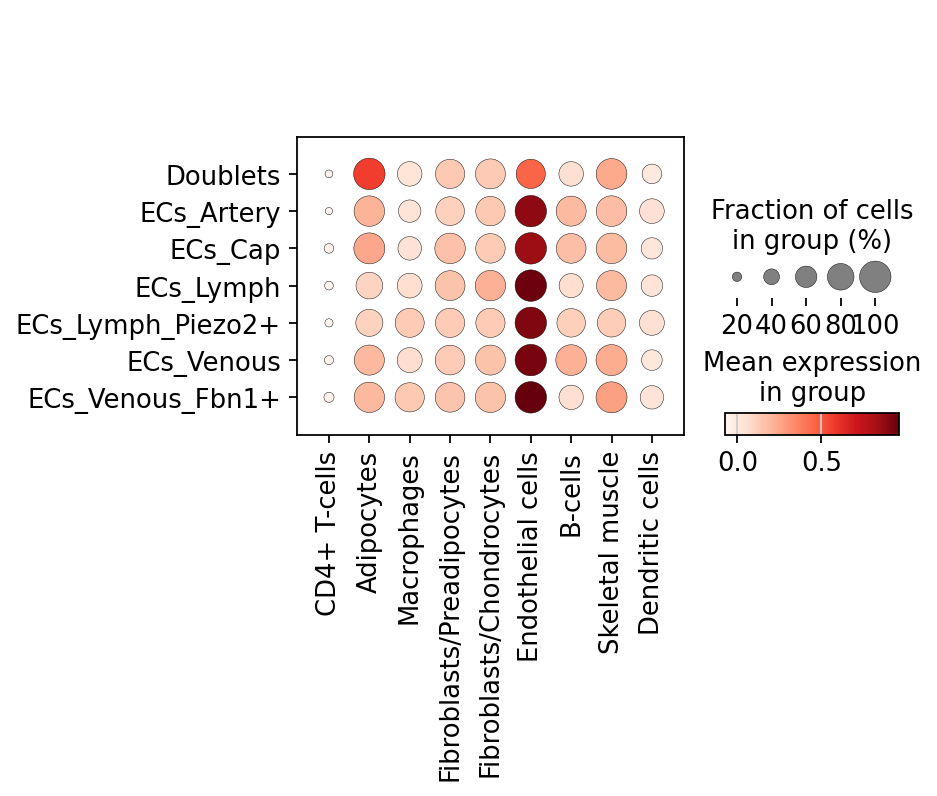

In [127]:
keys = filtered_markers.keys()

for key in keys:
    value = filtered_markers[key]
    sc.tl.score_genes(adata, value, ctrl_size=len(value), gene_pool=None, n_bins=50, score_name=key, use_raw=True)

sc.pl.dotplot(adata, list(keys), groupby='celltype_sub', dendrogram=False, save='_SunHumanMarkers50_celltype_ECs')

## Save the subclustered and annotated data

In [128]:
### Simplifying the dataframe
filtered_columns = adata.obs.filter(regex=r'score$', axis=1)

# Drop the filtered columns from the original DataFrame
adata.obs.drop(columns=filtered_columns.columns, inplace=True)

In [129]:
adata.write_h5ad('../data/taPVAT_ECs_annotated.h5ad')

### Clean up further for upload to CellxGene

In [78]:
adata = sc.read_h5ad('../data/taPVAT_ECs_annotated.h5ad')

In [79]:
adata

AnnData object with n_obs × n_vars = 11461 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad', 'leiden', '_scvi_batch', '_scvi_labels', 'leiden_sub', 'leiden_sub_1', 'celltype_sub', 'female_epithelial', 'adipocyte', 'male_epithelial', 'dendritic_cell', 'macrophage', 'ASPC', 'monocyte', 'endothelial', 'SMC', 'nk_cell', 'LEC', 'pericyte', 't_cell', 'b_cell', 'mast_cell',

In [89]:
obs_columns = ['log1p_n_genes_by_counts','log1p_total_counts', 'pct_counts_in_top_20_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo',
       'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier',
       'mt_outlier', 'n_genes', 'scDblFinder_class', 'Sample', 'doublet', '_scvi_batch', '_scvi_labels', 
       'leiden_sub_1', 'predicted_labels', 'over_clustering','conf_score', 'female_epithelial', 'adipocyte', 'male_epithelial',
       'dendritic_cell', 'macrophage', 'ASPC', 'monocyte', 'endothelial',
       'SMC', 'nk_cell', 'LEC', 'pericyte', 't_cell', 'b_cell', 'mast_cell',
       'neutrophil', 'mesothelium', 'endometrium', 'CD4+ T-cells',
       'Adipocytes', 'Macrophages', 'Fibroblasts/Preadipocytes',
       'Fibroblasts/Chondrocytes', 'Endothelial cells', 'B-cells',
       'Skeletal muscle', 'Dendritic cells', 'celltype_broad', 'celltype', 'leiden']

var_columns = ['mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts',
       'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts',
       'log1p_total_counts', 'n_cells']

obsm_keys = ['X_scVI_ec', 'X_umap_og', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs']
layers = ['raw_counts', 'scvi_normalized_ec', 'soupX_counts']

adata.obs.drop(columns = obs_columns, inplace = True)
adata.var.drop(columns = var_columns, inplace = True)
adata.uns = {}

for key in obsm_keys:
    del adata.obsm[key]
    
for layer in layers:
    del adata.layers[layer]

In [90]:
adata.obs.rename(columns = {'sample_type':'treatment', 
                            'majority_voting':'celltypist_annotation', 
                            'celltype_sub':'celltype_EC_subcluster', 
                            'leiden_sub':'leiden_EC_subcluster'}, inplace = True)

In [91]:
sc.pp.filter_genes(adata, min_cells = 1)

In [92]:
adata

AnnData object with n_obs × n_vars = 11461 × 18806
    obs: 'sample_id', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'tissue', 'diet', 'time', 'sex', 'batch', 'treatment', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'leiden_EC_subcluster', 'celltype_EC_subcluster', 'celltypist_annotation'
    var: 'gene_ids', 'n_cells'
    obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [93]:
adata.write_h5ad('../data/taPVAT_ECs_annotated_cellxgene.h5ad')

## Adding celltype_sub to original adata object

In [130]:
adata_sub = annotate.copy()

In [131]:
adata_sub.obs = pd.concat([adata_all.obs, adata.obs.celltype_sub], axis=1)
adata_sub.obs['celltype_sub'] = adata_sub.obs['celltype_sub'].astype('str')
adata_sub.obs['celltype'] = adata_sub.obs['celltype'].astype('str')
adata_sub.obs['celltype_sub'] = adata_sub.obs['celltype_sub'].fillna('replace')
adata_sub.obs['celltype_sub'] = adata_sub.obs['celltype_sub'].fillna(adata_sub.obs['celltype'])
adata_sub.obs['celltype_sub'] = adata_sub.obs.apply(lambda row: row['celltype'] if row['celltype_sub'] == 'nan' else row['celltype_sub'], axis=1)
adata_sub.obs['celltype'] = adata_sub.obs['celltype_sub'].copy().astype('category')
adata_sub

AnnData object with n_obs × n_vars = 71813 × 2000
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad', 'leiden', 'Ptprb_score', 'celltype_sub'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', '

In [132]:
adata_sub.obs.celltype.value_counts()

Adipocytes_Brown             41222
ECs_Cap                       6674
Fibroblasts_Bmper+_Nrxn1+     3522
Adipocytes_3                  3052
Pericytes                     2419
ECs_Artery                    2304
Adipocytes_2                  1793
Mesothelial_Cells             1546
Fibroblasts_Pi16+             1256
Fibroblasts_Bmper+            1100
Fibroblasts_Pi16++             806
Macrophages_M2                 779
ECs_Venous_Fbn1+               704
ECs_Venous                     663
Macrophages_M2_F13a1+          620
ECs_Lymph_Piezo2+              583
T_Cells                        570
ECs_Lymph                      501
Macrophages_M1_Cd80+           324
B_Cells_Naive                  264
NK_Cells                       246
Doublets                       202
SMCs                           185
Neutrophils                    158
Neuronal_Cells                 108
Dendritic_Cells                104
T_Regs                          93
Monocytes                       15
Name: celltype, dtyp

In [133]:
### Clean up the dataframe a bit
filtered_columns = ['Ptprb_score', 'celltype_sub']

# Drop the filtered columns from the original DataFrame
adata_sub.obs.drop(columns=filtered_columns, inplace=True)
adata_sub.obs.columns

Index(['sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo',
       'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier',
       'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class',
       'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type',
       'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W',
       'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W',
       'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype',
       'celltype_broad', 'leiden'],
      dtype='object')

In [134]:
adata_sub.write_h5ad('../data/taPVAT_combined_annotated_with_immune_fibro_ecs.h5ad')